In [1]:
# Import openCV
import cv2
import numpy as np

In [2]:
# Check your openCV version
cv2.__version__

'4.0.1'

In [3]:
# Load and Image
# Declare a variable with the path to your image
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision\DAY 1\mms.png"
# Load the image with openCV
img = cv2.imread(path)

In [4]:
# Check the image type
type(img)

numpy.ndarray

In [5]:
# What is the image type? -> type
#If type(img)==None -> the path is wrong

In [6]:
# Print the value of the pixels of the image
img

array([[[ 30,  53, 197],
        [ 30,  53, 197],
        [ 32,  60, 201],
        ...,
        [ 37,  85, 127],
        [ 24,  78, 116],
        [ 14,  14,  14]],

       [[ 31,  56, 199],
        [ 31,  55, 198],
        [ 32,  61, 202],
        ...,
        [ 22,  68, 112],
        [ 16,  64, 104],
        [ 14,  14,  14]],

       [[ 31,  57, 200],
        [ 31,  56, 199],
        [ 32,  61, 202],
        ...,
        [ 14,  52,  95],
        [ 11,  49,  89],
        [ 14,  14,  14]],

       ...,

       [[ 51, 178, 210],
        [ 50, 175, 207],
        [ 51, 176, 208],
        ...,
        [ 12,  79,  18],
        [ 16,  94,  31],
        [ 14,  14,  14]],

       [[ 50, 174, 202],
        [ 50, 176, 204],
        [ 51, 178, 206],
        ...,
        [ 12,  80,  19],
        [ 13,  84,   7],
        [ 14,  14,  14]],

       [[ 50, 174, 202],
        [ 50, 176, 204],
        [ 50, 176, 206],
        ...,
        [ 12,  78,  18],
        [ 13,  83,   9],
        [ 14,  14,  14]]

In [7]:
# Show the image using openCV
cv2.imshow('My image', img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [8]:
# Now lets display unsing matplotlib
# Import matplotlib
import matplotlib.pyplot as plt

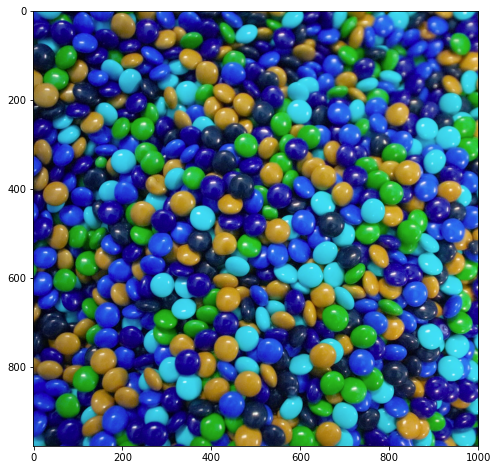

In [9]:
# Choose a pyplot figsize to make images fit nicely into the notebook
plt.figure(figsize=(8,8))
# Now display the image with plt
plt.imshow(img)

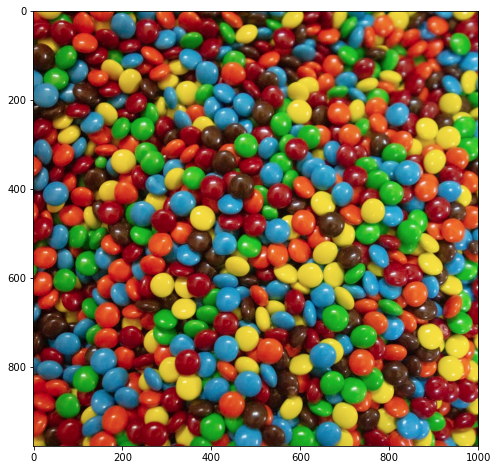

In [10]:
# Lets fix the colors
# Does your image look ok? are the colors the right ones?, if not, lets fix it!
# Remember that openCV will load images using BGR rather than RGB
# Change the image to RGB and diplay it again with plt
plt.figure(figsize=(8,8))
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(rgb_img)

In [11]:
# What is the shape of the image?
# Check the image shape
rgb_img.shape

(978, 1001, 3)

In [12]:
# Lets make it grayscale
# Now load an image in color and then transform it to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

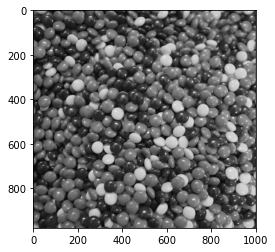

In [13]:
# Load the the image in grayscale, what are 2 ways you can do that?
img_gray_direct = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
# We need to indicate the colormap
# Display the grayscale image with matplotlib, make sure to include the colormap so it really 
# is grayscale
plt.imshow(gray_img, cmap='gray')

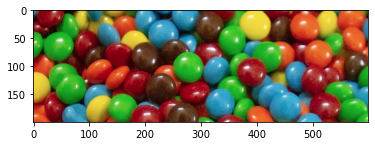

In [14]:
# Cropping an image
# Challenge, you know an image is nothing else than a NumPy ndarray, knowing that, how could you
# Crop an image?
# Lets now crop a Region of Interest of an image, load and image and crop different parts of it
cropped_img = rgb_img[200:400, 200:800]
plt.imshow(cropped_img)

In [15]:
# Save to disk the cropped areas
cv2.imwrite('cropped_mms.png', cv2.cvtColor(cropped_img, cv2.COLOR_RGB2BGR))

True

In [16]:
# Lets now annotate some images
# To annotate an image making a copy of it is always a good idea!
# Load an image and then make a copy of it
img_copy = cropped_img.copy()

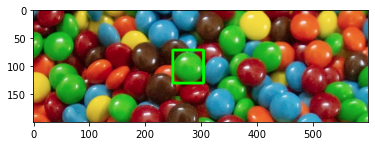

In [17]:
# Annotating images
# Rectangles
# Draw green rectangle on top of a region of interest in your image
cv2.rectangle(img_copy, (250,71),(305,130),(0,255,0),4)
plt.imshow(img_copy)

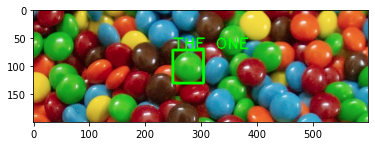

In [18]:
# Adding text to images
# Make a copy of your image and then write some text on top of the image
cv2.putText(img_copy, 'THE ONE', (250,70), cv2.FONT_HERSHEY_PLAIN, 2, (0,255,0),2)
plt.imshow(img_copy)

# MASKS

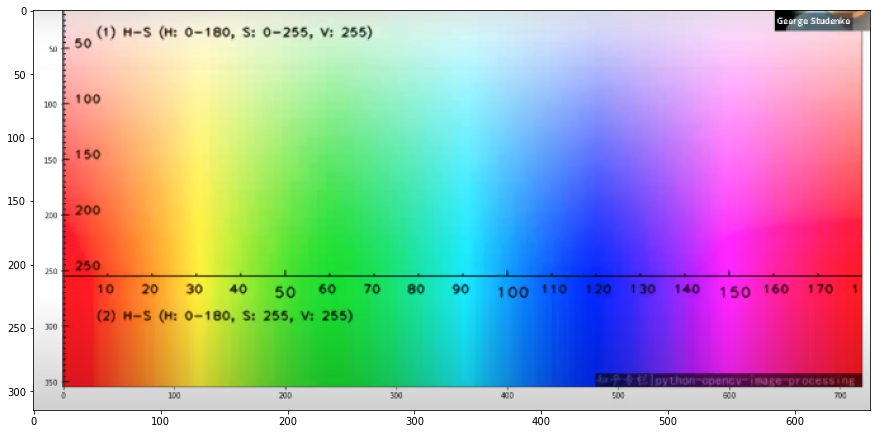

In [19]:
#HSV Image to determine numbers of H,S,V
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision"
# Load the image with openCV
img = cv2.imread(path + "\hsv_palette.png")
#Grayscale better to reduce computational calculations
plt.figure(figsize=(15,20))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [20]:
bgr_mms = cv2.imread(path)
rgb_mms = cv2.cvtColor(bgr_mms, cv2.COLOR_BGR2RGB)
hsv_mms = cv2.cvtColor(bgr_mms, cv2.COLOR_BGR2HSV)
plt.figure(figsize=(8,12))
plt.imshow(rgb_mms)

error: OpenCV(4.0.1) C:\ci\opencv-suite_1573470242804\work\modules\imgproc\src\color.cpp:181: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [21]:
green_lower_bounds = (40,0,0)
green_upper_bounds = (75,255,255)
mask_green_mms = cv2.inRange(hsv_mms, green_lower_bounds, green_upper_bounds)
blue_lower_bounds = (95,15,0)
blue_upper_bounds = (135,255,255)
mask_blue_mms = cv2.inRange(hsv_mms, blue_lower_bounds, blue_upper_bounds)
red_lower_bounds = (0,0,0)
red_upper_bounds = (150,255,255)
mask_red_mms = cv2.inRange(hsv_mms, red_lower_bounds, red_upper_bounds)
mms = bgr_mms.copy()
mms[(mask_blue_mms==0) & (mask_green_mms==0) & (mask_red_mms!=0)] = [0,0,0]
#plt.imshow(mask_army, cmap='gray')
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(mms, cv2.COLOR_BGR2RGB))

NameError: name 'hsv_mms' is not defined

In [146]:
mms = bgr_mms.copy()
mms = cv2.cvtColor(mms, cv2.COLOR_BGR2RGBA)
final_mask = (mask_blue_mms==0) & (mask_green_mms==0) & (mask_red_mms!=0)
for i in range(mms.shape[0]):
    for j in range(mms.shape[1]):
        if final_mask[i][j]:
            mms[i][j][3]=70
plt.figure(figsize=(8,12))
plt.imshow(mms)

AttributeError: 'NoneType' object has no attribute 'copy'

# Threshold

In [22]:
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision\DAY 2"
# Load the image with openCV
img = cv2.imread(path + "\squirrel.jpeg")
#Grayscale better to reduce computational calculations
img_gray_direct = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

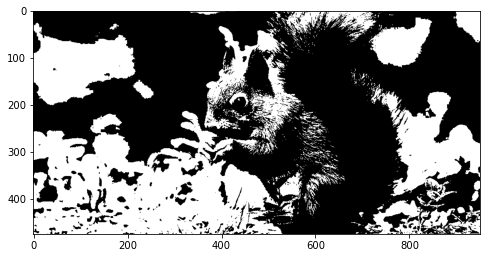

In [23]:
#Depending on a threshold value it changes the pixel's values
#Retval returns the threshold value (127)
# Values up 127 gonna be 255
retval,dst = cv2.threshold(img_gray_direct, 127, 255,cv2.THRESH_BINARY)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

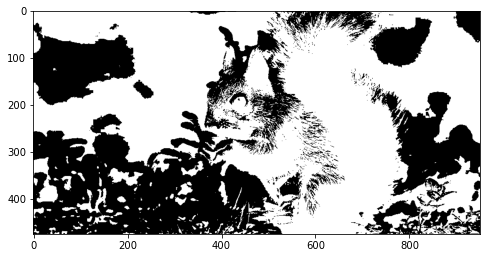

In [24]:
# Values up 127 gonna be 0
retval,dst = cv2.threshold(img_gray_direct, 127,255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

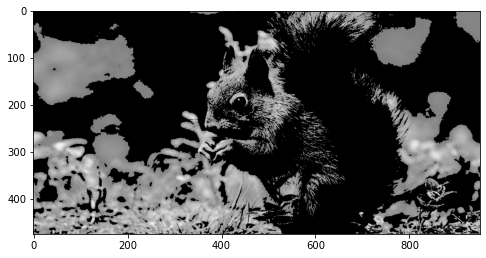

In [25]:
# Values down 127 gonna be 0 and bigger gonna mantain the gray scale
retval,dst = cv2.threshold(img_gray_direct, 127,255,cv2.THRESH_TOZERO)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

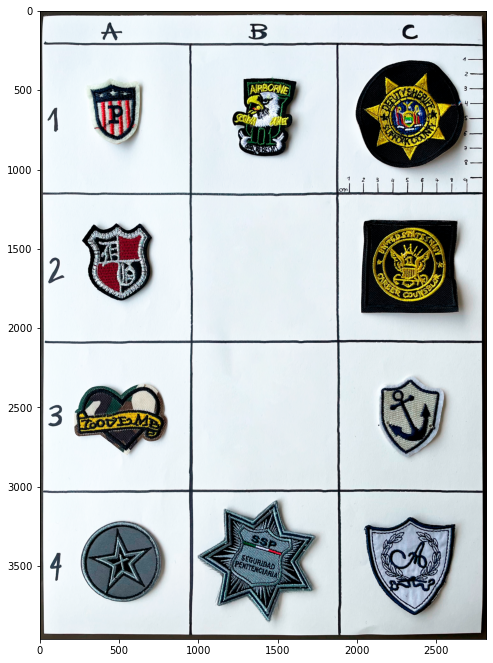

In [26]:
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision\DAY 2"
# Load the image with openCV
img = cv2.imread(path + "\Army.png")
#Grayscale better to reduce computational calculations
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
img_gray_direct = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

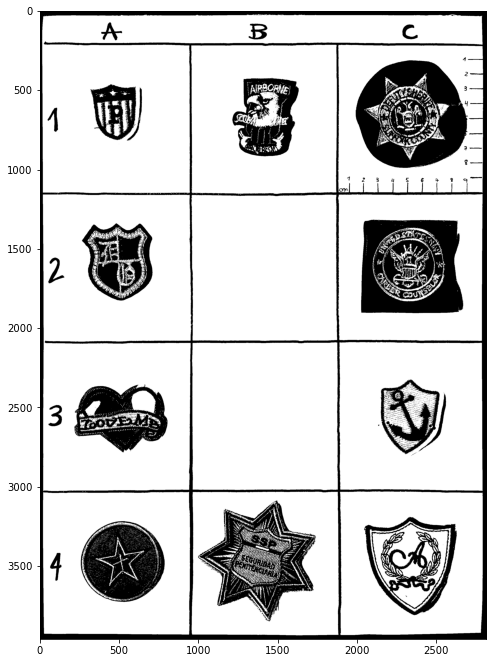

In [27]:
# To consider illumination
retval,dst = cv2.threshold(img_gray_direct, 127, 255,cv2.THRESH_BINARY)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

BEST THRESHOLD: 135.0


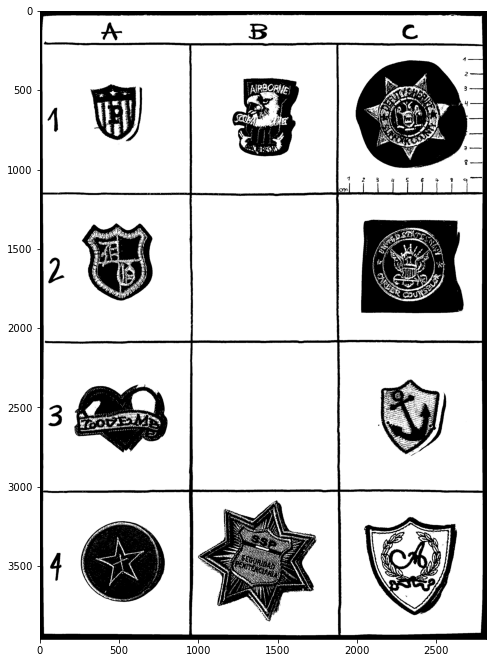

In [28]:
#OTSU threshold - to bimodal images
retval,dst = cv2.threshold(img_gray_direct, 0, 255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
print(f'BEST THRESHOLD: {retval}') #otsu calculates the optimal value for the threshold
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

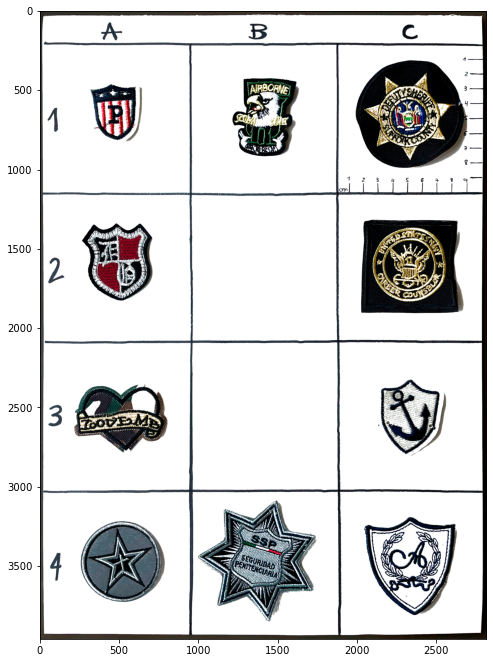

In [29]:
#USING THE DST AS A MASK
army_masked = img.copy()
army_masked[dst==255] = [255,255,255]
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(army_masked, cv2.COLOR_BGR2RGB))

### Adaptive threshold

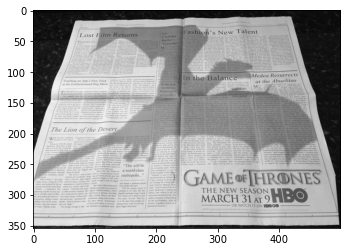

In [30]:
img_gray_direct = cv2.imread(r"DAY 2\newspaper.jpeg", cv2.IMREAD_GRAYSCALE)
plt.imshow(cv2.cvtColor(img_gray_direct, cv2.COLOR_BGR2RGB))

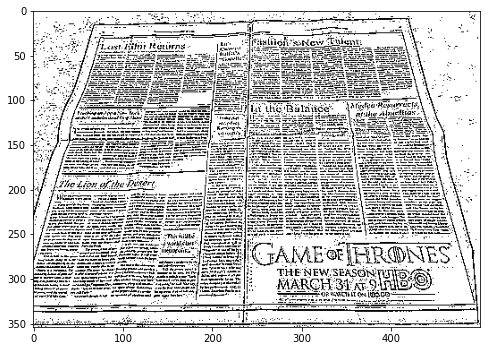

In [31]:
dst = cv2.adaptiveThreshold(img_gray_direct,255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3,5)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

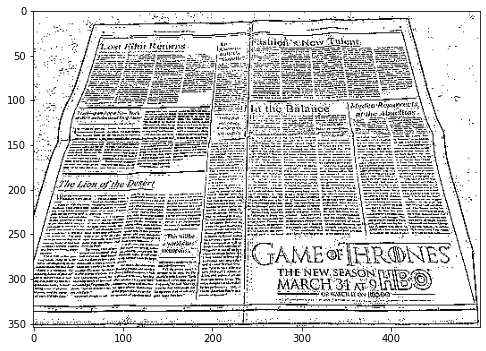

In [32]:
dst = cv2.adaptiveThreshold(img_gray_direct,255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 3,5)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

# MORPHOLOGICAL TRANSFORMATIONS

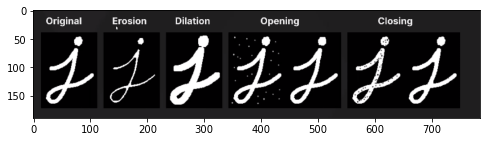

In [33]:
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision\DAY 2"
# Load the image with openCV
img = cv2.imread(path + "\morphologic_trans.png")
#Grayscale better to reduce computational calculations
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [34]:
import numpy as np
#Create Kernel
kernel = np.ones((5,5), np.uint8)
cross_kernel = cv2.getStructuringElement(cv2.MORPH_CROSS,(5,5)) #different way to make kernels

In [35]:
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision\DAY 2"
# Load the image with openCV
img = cv2.imread(path + "\squirrel.jpeg")
#Grayscale better to reduce computational calculations
img_gray_direct = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

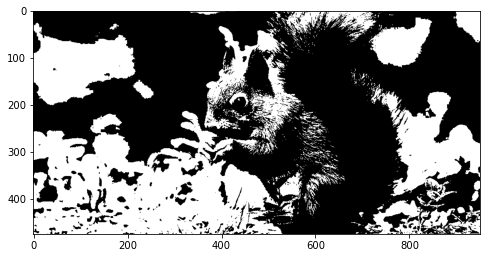

In [36]:
ret, dst = cv2.threshold(img_gray_direct,127,255,cv2.THRESH_BINARY)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

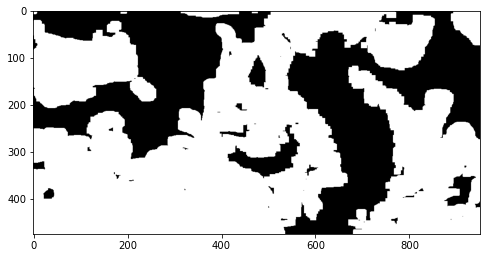

In [37]:
#Dilation
dilation = cv2.dilate(dst, kernel, iterations=3) #Kernel
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dilation, cv2.COLOR_BGR2RGB))

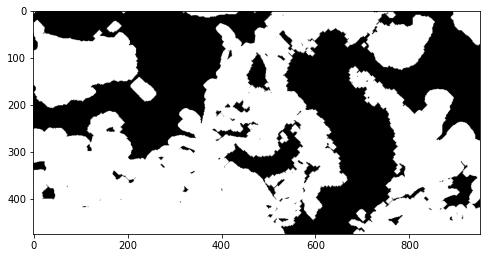

In [38]:
#Dilation
dilation = cv2.dilate(dst, cross_kernel, iterations=3) #Cross-Kernel
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dilation, cv2.COLOR_BGR2RGB))

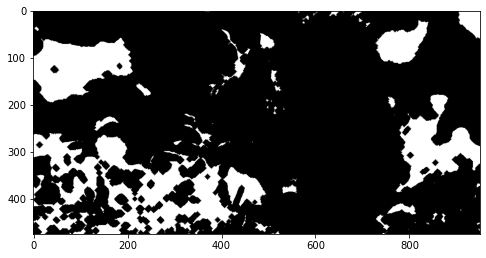

In [39]:
#Erosion
erotion = cv2.erode(dst, cross_kernel, iterations=3)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(erotion, cv2.COLOR_BGR2RGB))

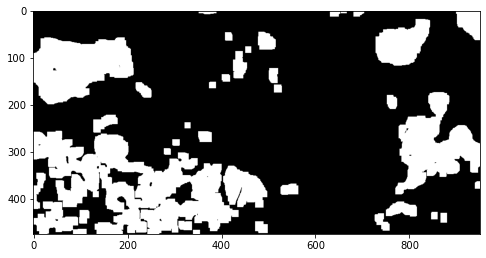

In [40]:
#Opening
opening = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel, iterations=3)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(opening, cv2.COLOR_BGR2RGB))

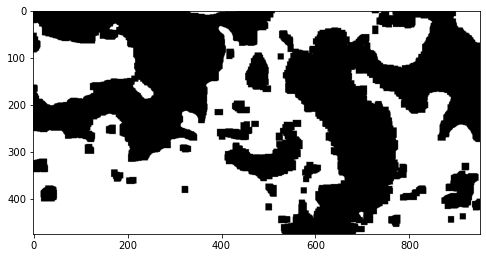

In [41]:
#Closing
closing = cv2.morphologyEx(dst, cv2.MORPH_CLOSE, kernel, iterations=3)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(closing, cv2.COLOR_BGR2RGB))

# Bitwise operators

In [42]:
# To apply logical functions over masks and create more complicated masks (AND, OR, NOT, XOR)

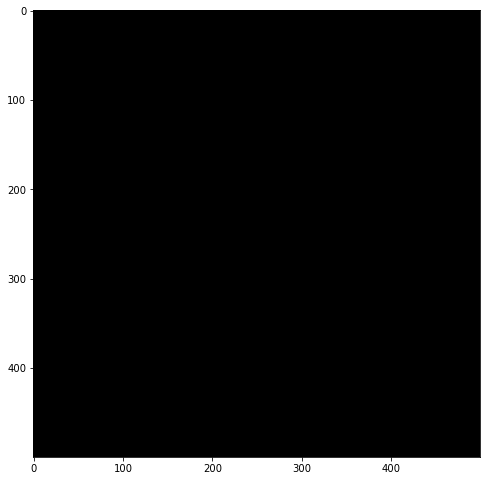

In [43]:
#Creating a black base image
base_image = np.zeros([500,500,3])
plt.figure(figsize=(8,12))
plt.imshow(base_image.astype('uint8'))

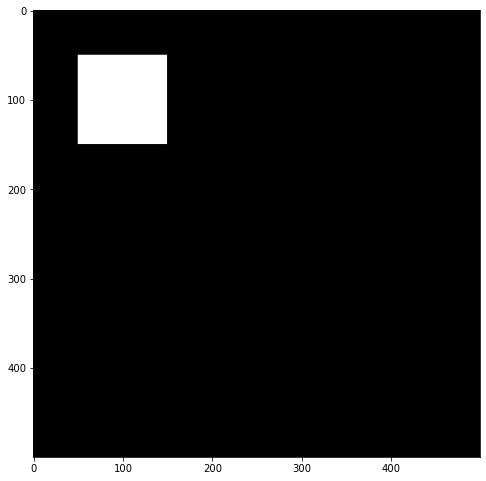

In [44]:
# Mask 1
mask_1 = base_image.copy()
mask_1[50:150,50:150]=(255,255,255)
plt.figure(figsize=(8,12))
plt.imshow(mask_1.astype('uint8'))

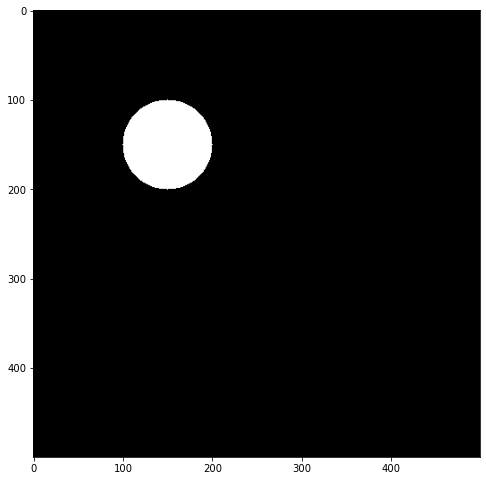

In [45]:
# Mask 2
mask_2 = base_image.copy()
#image = cv2.circle(image, center_coordinates, radius, color, thickness)
cv2.circle(mask_2, (150,150), 50, (255,255,255), cv2.FILLED)
plt.figure(figsize=(8,12))
plt.imshow(mask_2.astype('uint8'))

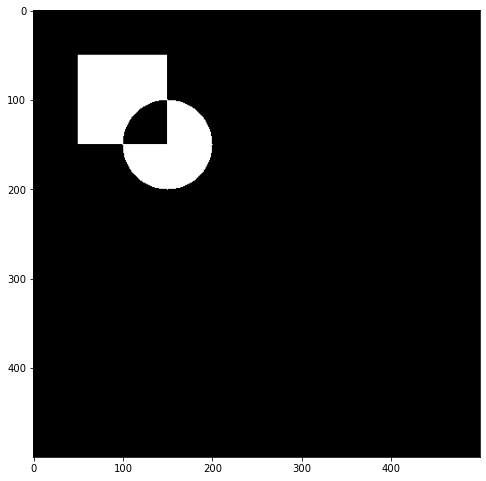

In [46]:
#Result
#XOR: True if and only if its arguments differ (one is true, the other is false)
result = cv2.bitwise_xor(mask_1, mask_2)
plt.figure(figsize=(8,12))
plt.imshow(result.astype('uint8'))

# KERNELS

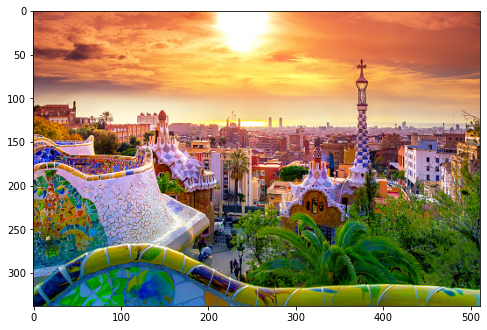

In [47]:
path = r"C:\Users\Pablo\Desktop\STRIVE AI\Strive_course\Chapter 3-DL\06. Computational vision\DAY 2\barcelona.jpg"
# Load the image with openCV
img = cv2.imread(path)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

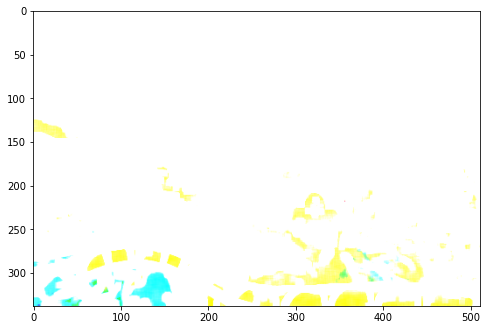

In [48]:
#BLUR: smoth the image
blur_kernel = np.ones((7,7), np.float32)/7*7 #bigger the kernel more effect
blur_image = cv2.filter2D(img, -1,blur_kernel)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(blur_image, cv2.COLOR_BGR2RGB))

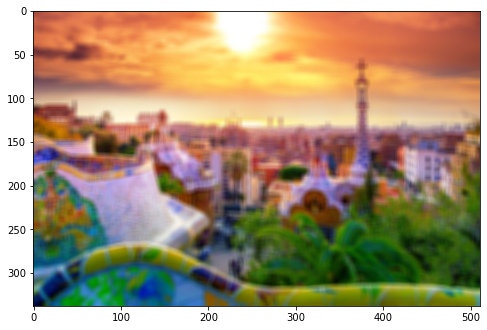

In [49]:
#Blur
blur = cv2.blur(img, (7,7))
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(blur, cv2.COLOR_BGR2RGB))

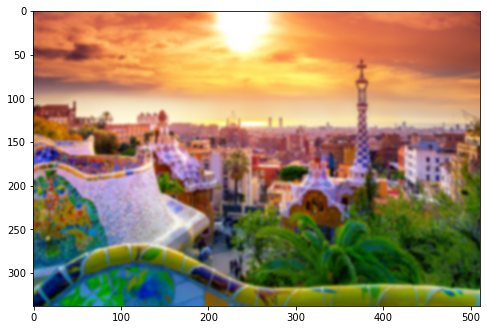

In [50]:
#Gaussian blur
gaussian_blur = cv2.GaussianBlur(img, (7,7),0)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(gaussian_blur, cv2.COLOR_BGR2RGB))

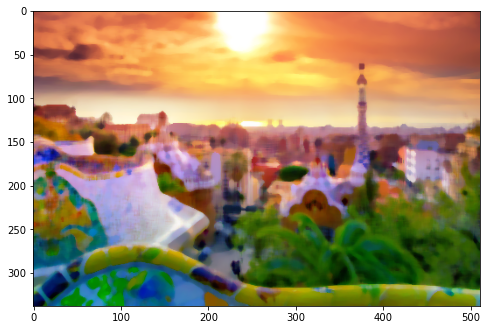

In [51]:
#Median blur
median_blur = cv2.medianBlur(img, 7)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(median_blur, cv2.COLOR_BGR2RGB))

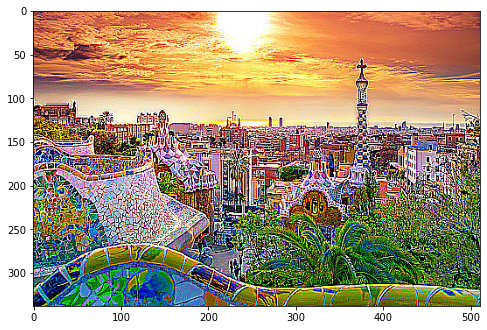

In [52]:
#Sharpening kernel: harder edges
sharpening_kernel = np.ones((3,3), np.float32) * -1
sharpening_kernel[1,1] = 3*3
sharped_image = cv2.filter2D(img, -1,sharpening_kernel)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(sharped_image, cv2.COLOR_BGR2RGB))

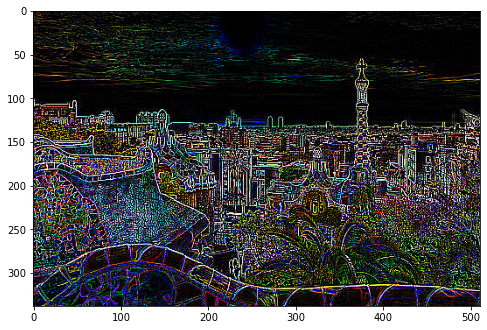

In [53]:
#Edge kernel: harder edges
edge_kernel = np.ones((3,3), np.float32) * -1
edge_kernel[1,1] = 3*3-1
edge_image = cv2.filter2D(img, -1,edge_kernel)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(edge_image, cv2.COLOR_BGR2RGB))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(<AxesSubplot:>, <matplotlib.image.AxesImage at 0x23db2381fd0>)

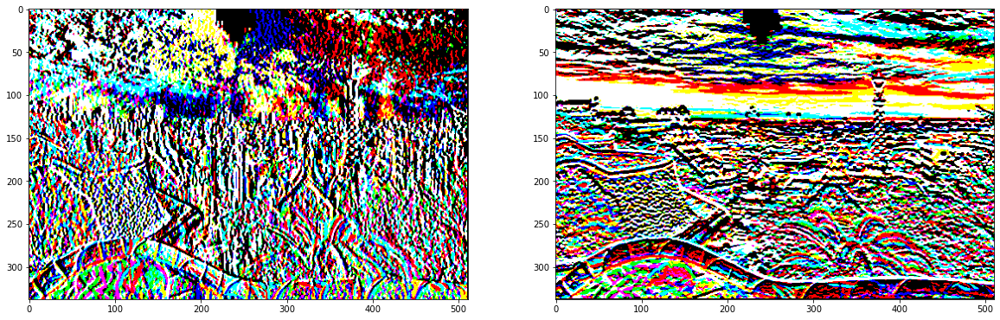

In [54]:
#SOBEL: to emphasize vertical or horizontal
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
plt.figure(figsize=(20,20))
plt.subplot(1,2,1),plt.imshow(sobelx)
plt.subplot(1,2,2),plt.imshow(sobely)

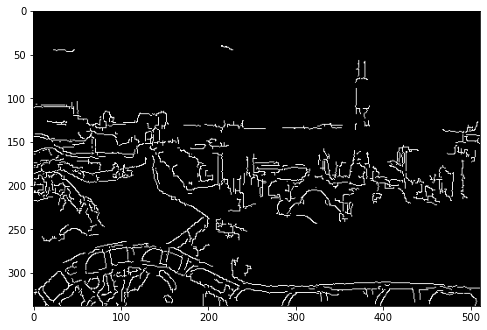

In [55]:
#CANNY: good for find edges, sometimes is a good idea to apply an extra Gaussian blur before. Four steps:
    #Noise Reduction - gaussian blur
    #Calculating Intensity Gradient of the Image - sobel
    #Suppression of False Edges - non-maximum suppression
    #Hysteresis Thresholding (thresh2>thresh1): 
        #pixels<thresh1: excluded
        #pixels>thresh2: included
        #thresh1<pixels<thresh2: if pixel is connected with included pixels then we include them too
canny = cv2.Canny(image=blur, threshold1=100, threshold2=200)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(canny, cv2.COLOR_BGR2RGB))

# HOUGH TRANSFORM

In [56]:
#To detect simple forms (lines, circles...) in an image

In [61]:
import cv2
import numpy as np
# Read image 
path = "C:/Users/Pablo/Desktop/STRIVE AI/Strive_course/Chapter 3-DL/06. Computational vision/DAY 2/"
img = cv2.imread(path + 'roads.jpg')
# Convert the image to gray-scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Find the edges in the image using canny detector
edges = cv2.Canny(gray, 50, 200)
# Detect points that form a line
max_slider = 255
lines = cv2.HoughLinesP(edges, 1, np.pi/180, max_slider, minLineLength=1, maxLineGap=250)
# Draw lines on the image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv2.line(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
# Show result
cv2.imshow("Result Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

In [60]:
cv2.imshow("Result Image", edges)
cv2.waitKey(0)
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

# CONTOURS

In [184]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
# Read image 
path = "C:/Users/Pablo/Desktop/STRIVE AI/Strive_course/Chapter 3-DL/06. Computational vision/DAY 3/"
img = cv2.imread(path + 'coins.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

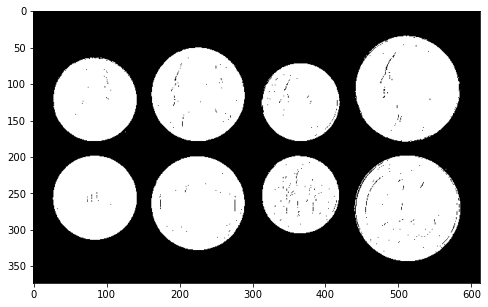

In [185]:
retval,dst = cv2.threshold(gray, 220, 255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

In [186]:
contours, hierarchy = cv2.findContours(dst,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

In [187]:
len(contours)

16

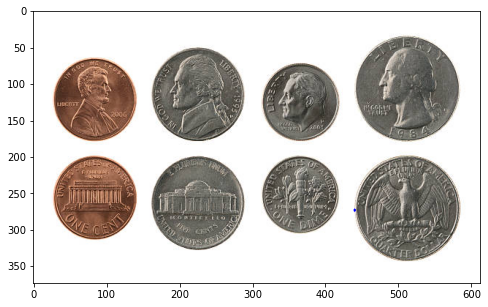

In [188]:
copy = img.copy()
cv2.drawContours(copy,contours, 0, (255,0,0),2) #FIRST CONTOUR IS NOISE
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

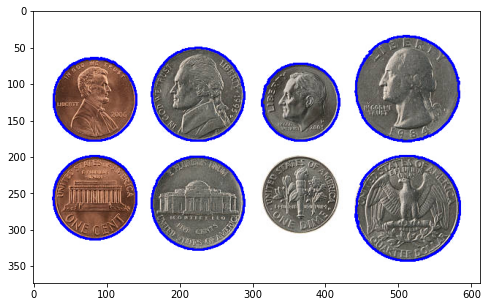

In [189]:
copy = img.copy()
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)
cv2.drawContours(copy,sorted_contours[0:7], -1, (255,0,0),2) #taking only the biggers
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

In [190]:
def sort_contours(cnts, method="left-to-right"):
    # initialize the reverse flag and sort index
    reverse = False
    i = 0

    # handle if we need to sort in reverse
    if method == "right-to-left" or method == "bottom-to-top":
        reverse = True

    # handle if we are sorting against the y-coordinate rather than
    # the x-coordinate of the bounding box
    if method == "top-to-bottom" or method == "bottom-to-top":
        i = 1

    # construct the list of bounding boxes and sort them from top to
    # bottom
    boundingBoxes = [cv2.boundingRect(c) for c in cnts]
    (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
                                        key=lambda b: b[1][i], reverse=reverse))
    # return the list of sorted contours and bounding boxes
    return (cnts, boundingBoxes)

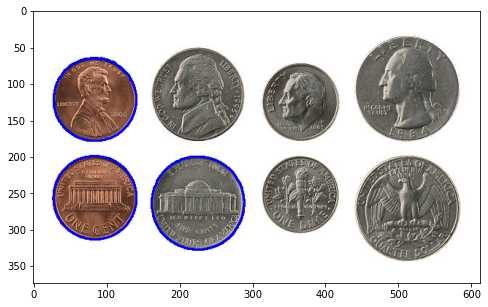

In [191]:
copy = img.copy()
left_right_contours, bb = sort_contours(sorted_contours[0:7]) #sorting left to rigth
cv2.drawContours(copy,left_right_contours[:3], -1, (255,0,0),2)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

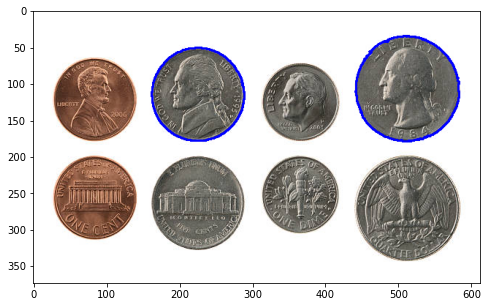

In [192]:
copy = img.copy()
left_right_contours, bb = sort_contours(sorted_contours[0:7],'top-to-bottom') #sorting top to bottom
cv2.drawContours(copy,left_right_contours[:2], -1, (255,0,0),2)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

480


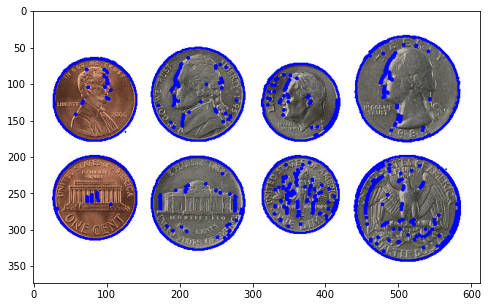

In [193]:
#TREE
contours, hierarchy = cv2.findContours(dst,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
print(len(contours))
copy = img.copy()
cv2.drawContours(copy,contours, -1, (255,0,0),2) #FIRST CONTOUR IS NOISE
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

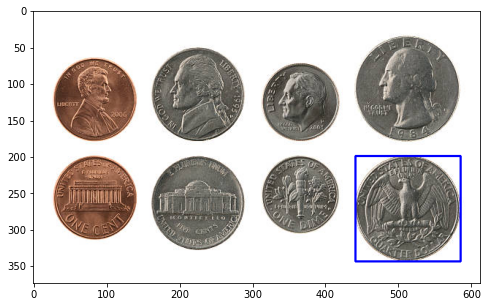

In [194]:
#Bounding rectangle
clean_contours = sorted_contours[0:7]
x,y,w,h = cv2.boundingRect(clean_contours[0])
copy = img.copy()
cv2.rectangle(copy, (x,y), (x+w,y+h), (255,0,0),2)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

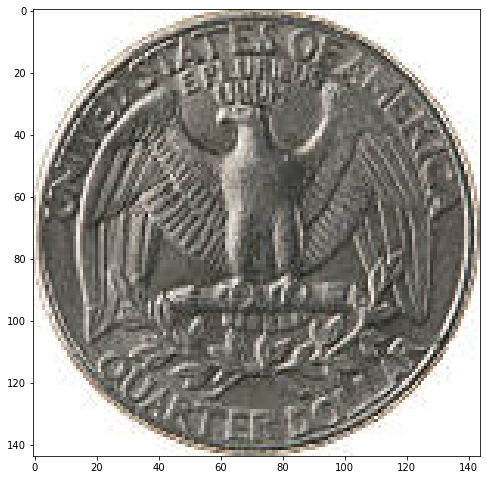

In [195]:
#Crop image
biggest_coin = img[y:y+h, x:x+w]
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(biggest_coin, cv2.COLOR_BGR2RGB))

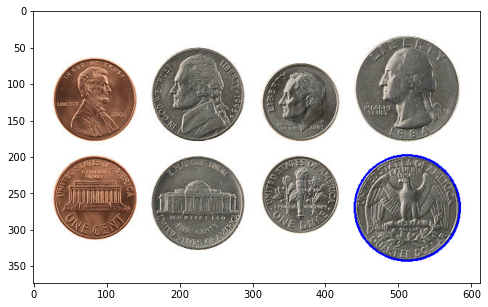

In [196]:
#Cercle count
(x,y), radius = cv2.minEnclosingCircle(clean_contours[0])
copy = img.copy()
cv2.circle(copy, (int(x),int(y)), int(radius), (255,0,0),2)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

### Convex Hull

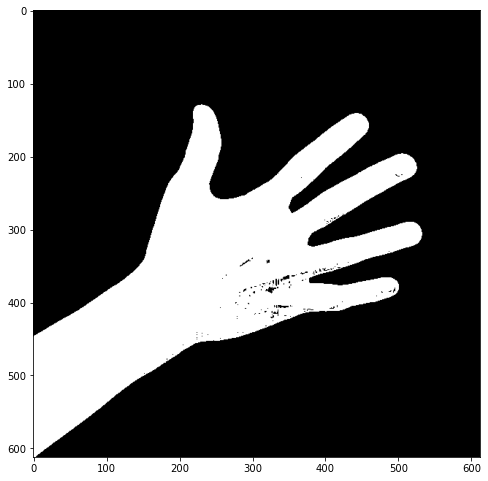

In [197]:
# Read image 
path = "C:/Users/Pablo/Desktop/STRIVE AI/Strive_course/Chapter 3-DL/06. Computational vision/DAY 3/"
img = cv2.imread(path + 'hand.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
retval,dst = cv2.threshold(gray, 220, 255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

In [198]:
contours, hierarchy = cv2.findContours(dst,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
len(contours)

1

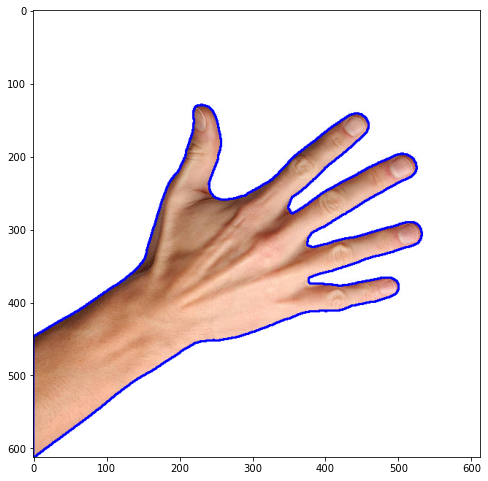

In [199]:
copy = img.copy()
cv2.drawContours(copy,contours, 0, (255,0,0),2)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

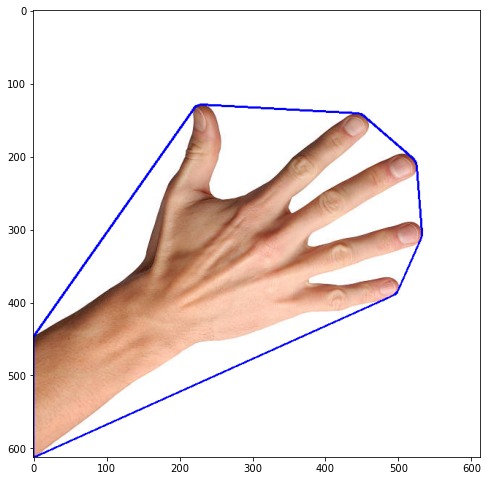

In [200]:
hull = cv2.convexHull(contours[0])
copy = img.copy()
cv2.drawContours(copy,[hull],0,(255,0,0),2)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(copy, cv2.COLOR_BGR2RGB))

# YOLO

In [201]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from yolo_helpers import *

In [202]:
models_config_path = 'models/yolov3.cfg'
models_weights_path = 'models/yolov3.weights'

In [203]:
net = cv2.dnn.readNetFromDarknet(models_config_path, models_weights_path)

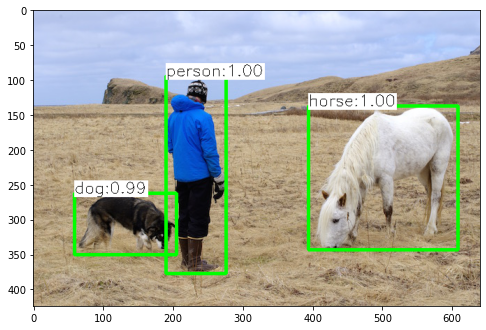

In [204]:
img = cv2.imread('img/person.jpg')
blob=cv2.dnn.blobFromImage(img,1/255.0,(416,416),swapRB=True)
net.setInput(blob)
output_layers = getOutputsNames(net)
outs = net.forward(output_layers)
postprocess(img, outs)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

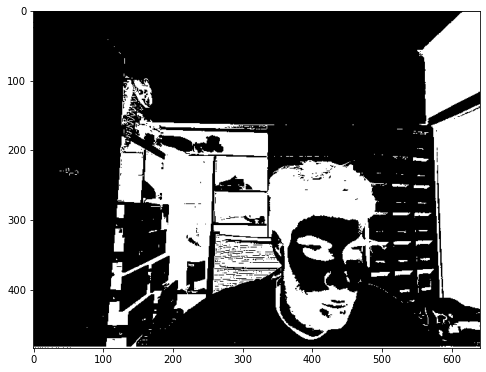

In [229]:
#DELETE
img = cv2.imread('DAY 2/pruebas.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
retval,dst = cv2.threshold(gray, 80, 255,cv2.THRESH_BINARY_INV)
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

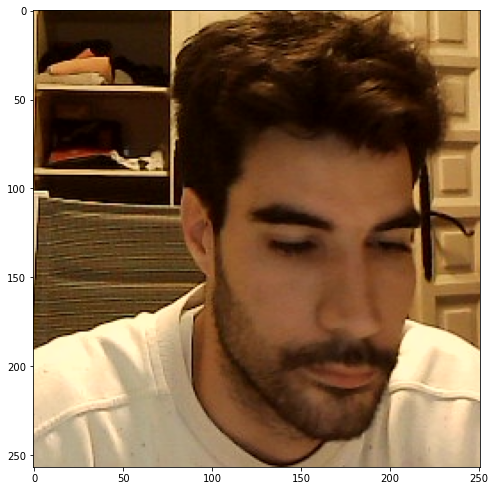

In [231]:
contours, hierarchy = cv2.findContours(dst,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
copy = img.copy()
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)
clean_contours = sorted_contours[0:3]
x,y,w,h = cv2.boundingRect(clean_contours[1])
copy = img.copy()
cv2.rectangle(copy, (x,y), (x+w,y+h), (255,0,0),2)
crop_img = img[y:y+h, x:x+w]
plt.figure(figsize=(8,12))
plt.imshow(cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB))